# Carga datos

In [20]:
import pandas as pd
import numpy as np

In [2]:
!wget -O df_final.csv "https://github.com/Eze-Mz/mentoria_2025/raw/main/datasets/df_final.csv"

--2025-09-28 14:09:53--  https://github.com/Eze-Mz/mentoria_2025/raw/main/datasets/df_final.csv
Resolving github.com (github.com)... 4.228.31.150
Connecting to github.com (github.com)|4.228.31.150|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Eze-Mz/mentoria_2025/main/datasets/df_final.csv [following]
--2025-09-28 14:09:53--  https://raw.githubusercontent.com/Eze-Mz/mentoria_2025/main/datasets/df_final.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13101337 (12M) [text/plain]
Saving to: ‘df_final.csv’

df_final.csv        100%[===================>]  12.49M  69.1MB/s    in 0.2s    

2025-09-28 14:09:54 (69.1 MB/s) - ‘df_final.csv’ saved [13101337/13101337]



In [3]:
df = pd.read_csv("df_final.csv", encoding="utf-8-sig")
df_original = df.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8882 entries, 0 to 8881
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id_str                   8882 non-null   int64  
 1   date                     8882 non-null   object 
 2   rawContent               8882 non-null   object 
 3   replyCount               8882 non-null   int64  
 4   retweetCount             8882 non-null   int64  
 5   likeCount                8882 non-null   float64
 6   quoteCount               8882 non-null   int64  
 7   conversationId           8882 non-null   int64  
 8   hashtags                 8882 non-null   object 
 9   viewCount                8882 non-null   float64
 10  pcia                     8882 non-null   object 
 11  mes                      8882 non-null   int64  
 12  user_id                  8882 non-null   int64  
 13  pcia1                    8882 non-null   object 
 14  hashtags1               

# Versión BERTopic configurada

## Embeddings

Primero vamos a examinar la cantidad de tokens en promedio de nuestros documentos, en principio no deberíamos tener problema con la cantidad de tokens puesto que se trata de posteos cortos de Twitter.

Luego vamos a probar distintas formas de realizar los embeddings buscando encontrar una opción que nos permita separar e interpretar mejor los temas en nuestro corpus.


### Revisión cantidad de tokens

#### sentence-transformers

**Sentence-Transformers es un Envoltorio (Wrapper)**: La librería sentence-transformers es una capa de alto nivel construida sobre Hugging Face. Cuando cargas un modelo de SBERT, la librería hace dos cosas:
- Descarga el modelo pre-entrenado desde el Hub de Hugging Face.
- Descarga el tokenizador correspondiente a ese modelo (ej. BertTokenizerFast).

**El Tokenizador es de Hugging Face**: El objeto tokenizer_sbert de tu código es una instancia de una clase de la librería transformers, como AutoTokenizer. No es algo que SBERT invente, sino que usa el tokenizador oficial con el que el modelo fue entrenado.

uando ejecutas tokenizer_sbert(docs, ...), ocurren los siguientes pasos para cada texto en la lista docs:
- Tokenización: El texto se divide en "tokens" (palabras o sub-palabras) según las reglas del modelo (ej. WordPiece para BERT). "Hola mundo" -> ['hola', 'mun', '##do'].
- Conversión a IDs: Cada token se mapea a un número entero (ID) del vocabulario del modelo. ['hola', 'mun', '##do'] -> [8324, 1525, 2255].
- Añadir Tokens Especiales: Si add_special_tokens=True, se añaden los tokens que el modelo necesita para entender la estructura de la secuencia, como [CLS] al inicio y [SEP] al final.
- Creación del Batch: El resultado de todos los textos se agrupa en un objeto BatchEncoding, que es básicamente un diccionario que contiene listas de input_ids, attention_mask (si se solicita), etc.

In [4]:
from sentence_transformers import SentenceTransformer

/home/ezequiel/ESTUDIO/estudio/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
model_sbert = SentenceTransformer('sentence-transformers/paraphrase-multilingual-mpnet-base-v2')
#model_sbert = SentenceTransformer('hiiamsid/sentence_similarity_spanish_es')

tokenizer_sbert = model_sbert.tokenizer

In [6]:
docs = df.rawContent_clean.to_list()

# https://huggingface.co/docs/transformers/en/main_classes/tokenizer#transformers.PreTrainedTokenizer.__call__
# https://github.com/huggingface/transformers/blob/v4.56.2/src/transformers/tokenization_utils_base.py#L2828
batch_encoding = tokenizer_sbert(
    docs,
    add_special_tokens=True,    # [CLS], [SEP], etc.
    truncation=False,           # do not cut off any tokens
    padding=False,               # pad each sequence to the max length in this batch
    return_attention_mask=False,
    return_token_type_ids=False,
)

Token indices sequence length is longer than the specified maximum sequence length for this model (154 > 128). Running this sequence through the model will result in indexing errors


In [7]:
# la cantidad de documentos tokenizados
# los input_ids son los números de los tokens (https://huggingface.co/docs/transformers/en/glossary#input-ids)
len(batch_encoding.input_ids)

8882

In [8]:
all_token_lists = [
    tokenizer_sbert.convert_ids_to_tokens(ids)
    for ids in batch_encoding["input_ids"]
]

In [9]:
print(all_token_lists[0])

['<s>', '▁Bol', 'uda', '▁ahí', '▁dice', '▁que', '▁yo', '▁debería', '▁pesar', '▁43', 'kg', '▁eso', '▁está', '▁para', '▁el', '▁orto', '.', '▁Yo', '▁sé', '▁que', '▁tengo', '▁sobre', 'pes', 'o', '▁y', '▁por', '▁eso', '▁estoy', '▁empeza', 'ndo', '▁a', '▁cuidar', 'me', '▁más', '▁para', '▁bajar', '▁de', '▁peso', ',', '▁por', '▁mi', '▁altura', '▁mi', '▁peso', '▁ideal', '▁sería', '▁64', '</s>']


In [10]:
all_lengths = [len(toks) for toks in all_token_lists]
all_lengths[0:10]

[48, 39, 20, 27, 52, 16, 15, 41, 19, 58]

In [12]:
df[f"feature_tokens_sbert"] = all_token_lists
df[f"feature_tokens_len_sbert"] = all_lengths

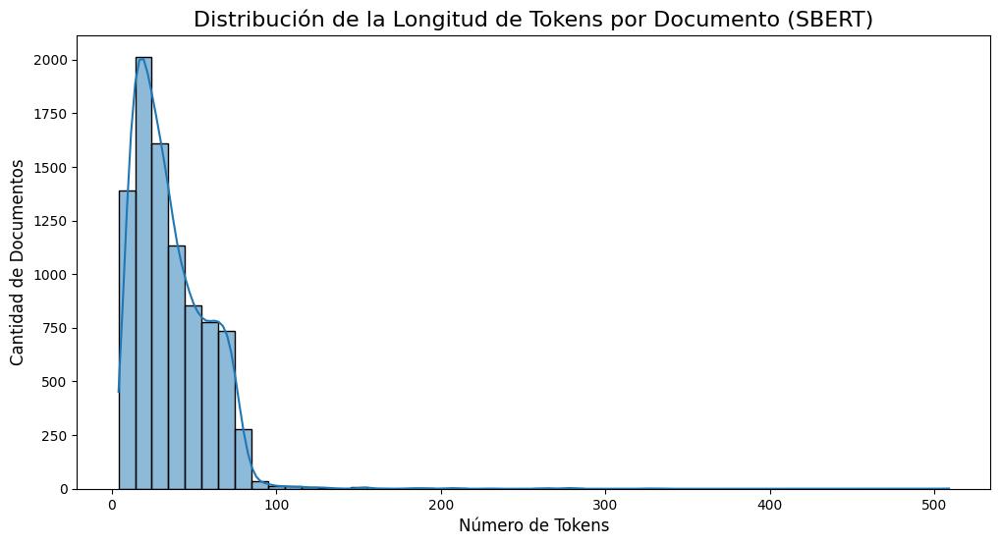

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Crear el histograma
sns.histplot(df["feature_tokens_len_sbert"], kde=True, bins=50)

# Añadir títulos y etiquetas
plt.title("Distribución de la Longitud de Tokens por Documento (SBERT)", fontsize=16)
plt.xlabel("Número de Tokens", fontsize=12)
plt.ylabel("Cantidad de Documentos", fontsize=12)

# Mostrar el gráfico
plt.show()

En principio no vmaos a tener problemas con las represetnaciones de los documentos ya que su basta mayoría tiene menos de 128 tokens.

In [14]:
import collections

# 1. Aplanar la lista de listas en una sola lista de tokens
all_tokens = [token for sublist in all_token_lists for token in sublist]

# 2. Definir y filtrar los tokens especiales que no queremos contar
special_tokens = ["[CLS]", "[SEP]", "[PAD]", "<s>", "</s>"]
tokens_sin_especiales = [token for token in all_tokens if token not in special_tokens]

# 3. Contar la frecuencia de cada token
token_counts = collections.Counter(tokens_sin_especiales)

# 4. Obtener y mostrar los 20 tokens más comunes
print("Los 20 tokens más frecuentes:")
for token, count in token_counts.most_common(20):
    print(f"{token:<20} {count}")

Los 20 tokens más frecuentes:
▁de                  9464
,                    8887
.                    8285
▁que                 7093
▁la                  6228
▁y                   5436
o                    4895
▁a                   4763
s                    3943
▁obes                3880
▁no                  3665
▁el                  3525
▁en                  3299
▁es                  3187
▁con                 3065
a                    2862
▁un                  2482
▁obesidad            2224
▁se                  2049
▁los                 1956


Ese carácter, que a veces se visualiza como un guion bajo _ pero en realidad es un carácter especial de espacio       (U+2581), **indica que el token corresponde al inicio de una palabra que tenía un espacio antes de ella**.

**El Tokenizador: SentencePiece**

El modelo que estás usando (paraphrase-multilingual-mpnet-base-v2) utiliza un tokenizador llamado SentencePiece. A diferencia de los tokenizadores más antiguos como WordPiece (usado por BERT), SentencePiece no divide el texto por espacios antes de tokenizar. Trata el texto como un flujo continuo y aprende a codificar los espacios como parte de los tokens.

**¿Cómo Funciona?**

- Un token sin el prefijo (ej. obesidad) significa que esta palabra estaba al comienzo del texto o pegada a la palabra anterior sin espacio.
- Un token con el prefijo (ej.  obesidad) significa que en el texto original había un espacio antes de la palabra "obesidad".



#### Robertuito

In [54]:
import torch
from transformers import AutoTokenizer, AutoModel

In [55]:
model_name = "pysentimiento/robertuito-base-uncased"
device = "cuda" if torch.cuda.is_available() else "cpu"
tokenizer_robertuito = AutoTokenizer.from_pretrained(model_name)
model_robertuito = AutoModel.from_pretrained(model_name).to(device)

Some weights of RobertaModel were not initialized from the model checkpoint at pysentimiento/robertuito-base-uncased and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [56]:
max_len = model_robertuito.config.max_position_embeddings
print(f"The maximum model length is: {max_len}")
print("vocabulary size:", tokenizer_robertuito.vocab_size)
print("special tokens:", tokenizer_robertuito.all_special_tokens)
print("special token ids:", tokenizer_robertuito.all_special_ids)
print("model input names:", tokenizer_robertuito.model_input_names)
print("max context size:", tokenizer_robertuito.model_max_length)

The maximum model length is: 130
vocabulary size: 30000
special tokens: ['<s>', '</s>', '<unk>', '<pad>', '<mask>']
special token ids: [0, 2, 3, 1, 4]
model input names: ['input_ids', 'token_type_ids', 'attention_mask']
max context size: 1000000000000000019884624838656


In [57]:
df[f"feature_tokens_robertuito"] = df['rawContent_clean'].apply(
      lambda x: tokenizer_robertuito.encode((x))
  )
df[f"feature_tokens_len_robertuito"] = df[f"feature_tokens_robertuito"].apply(len)

In [58]:
df[["feature_tokens_robertuito", "feature_tokens_len_robertuito"]]

,feature_tokens_robertuito,feature_tokens_len_robertuito
0,"[0, 8254, 1411, 1254, 443, 560, 2517, 4337, 11...",44
1,"[0, 3035, 413, 1858, 2112, 3710, 5904, 3060, 4...",31
2,"[0, 446, 12539, 413, 507, 18486, 599, 706, 437...",18
3,"[0, 23217, 471, 4497, 582, 924, 412, 4337, 939...",24
4,"[0, 774, 474, 694, 12811, 452, 446, 856, 18065...",43
...,...,...
8877,"[0, 583, 507, 1402, 45, 446, 19547, 489, 443, ...",27
8878,"[0, 1226, 27997, 3375, 437, 445, 4497, 3375, 4...",23
8879,"[0, 4761, 464, 442, 1004, 5233, 583, 442, 2651...",11
8880,"[0, 870, 412, 507, 2787, 474, 582, 804, 6179, ...",20


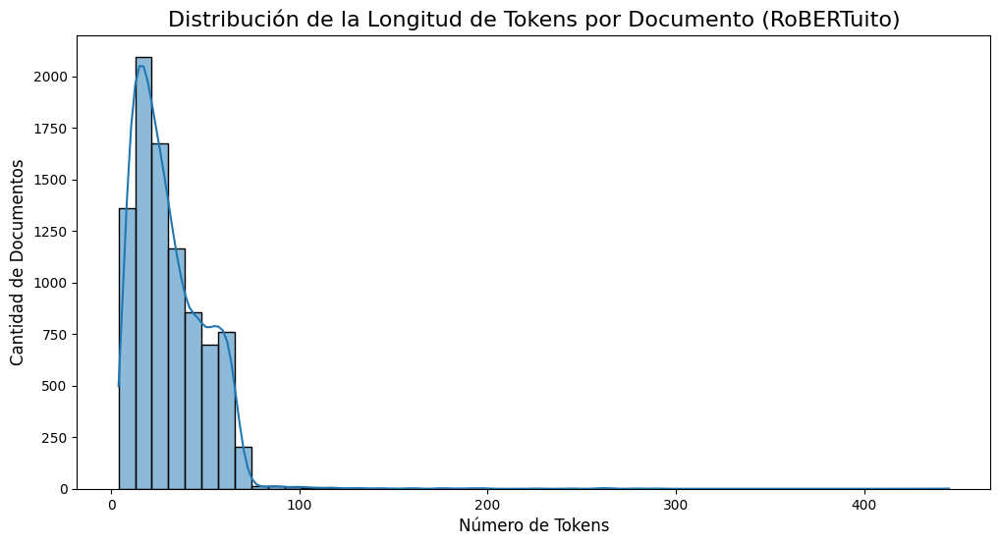

In [59]:
plt.figure(figsize=(12, 6))

# Crear el histograma
sns.histplot(df["feature_tokens_len_robertuito"], kde=True, bins=50)

# Añadir títulos y etiquetas
plt.title("Distribución de la Longitud de Tokens por Documento (RoBERTuito)", fontsize=16)
plt.xlabel("Número de Tokens", fontsize=12)
plt.ylabel("Cantidad de Documentos", fontsize=12)

# Mostrar el gráfico
plt.show()

### Generación embeddings

#### sentence-transformer

In [20]:
# transformar los documentos a minúsculas antes de generar los embeddings
df["rawContent_clean_lower"] = df["rawContent_clean"].str.lower()
docs = df.rawContent_clean_lower.to_list()

In [21]:
# https://sbert.net/docs/package_reference/sentence_transformer/SentenceTransformer.html#sentence_transformers.SentenceTransformer.encode
embeddings_sbert = model_sbert.encode(docs, show_progress_bar=True, device="cuda:0")

Batches: 100%|██████████| 278/278 [00:07<00:00, 35.14it/s]


In [52]:
embeddings_sbert

array([[ 0.05866887,  0.14356773, -0.01010027, ...,  0.08515014,
        -0.12369075, -0.02704864],
       [-0.01217289,  0.19006963, -0.01119089, ...,  0.04160252,
         0.02012774, -0.09141764],
       [ 0.04744128, -0.01423646, -0.01489111, ...,  0.06859162,
        -0.09358891, -0.04869234],
       ...,
       [ 0.09295882,  0.28021985, -0.0105479 , ...,  0.08177789,
        -0.17000565,  0.00683985],
       [ 0.07021613,  0.10396935, -0.01201593, ...,  0.06157427,
        -0.08187784, -0.07380187],
       [ 0.09861416,  0.2211105 , -0.01578772, ...,  0.04379929,
        -0.08043195, -0.04646375]], shape=(8882, 768), dtype=float32)

##### Exploración

In [22]:
from sentence_transformers import util
import torch

# Elige el índice del documento que quieres usar como referencia
doc_id = 5000
documento_referencia = df.iloc[doc_id]['rawContent']

print(f"Buscando documentos similares a: '{documento_referencia}'")

# Calcula la similitud del coseno entre el embedding de referencia y todos los demás
# Convertimos los embeddings a tensores de PyTorch para usar la utilidad
embedding_referencia = torch.tensor(embeddings_sbert[doc_id])
todos_los_embeddings = torch.tensor(embeddings_sbert)



Buscando documentos similares a: 'Junio es de Géminis obesa'


In [23]:
# Calculamos la similitud
# https://sbert.net/docs/package_reference/util.html#sentence_transformers.util.cos_sim
cos_scores = util.cos_sim(embedding_referencia, todos_los_embeddings)[0]

In [24]:
# Obtenemos los 5 más similares (sin incluir el documento mismo)
# https://docs.pytorch.org/docs/stable/generated/torch.topk.html
top_results = torch.topk(cos_scores, k=6)
top_results

torch.return_types.topk(
values=tensor([1.0000, 0.7923, 0.7865, 0.7842, 0.7833, 0.7807]),
indices=tensor([5000, 6718, 8258,   58, 6203, 4746]))

In [25]:
# Lista para guardar los resultados
results_data = []

# Iteramos para recolectar los datos
for score, idx in zip(top_results[0], top_results[1]):
    # Convertimos a float de Python para evitar problemas con tensores
    score_val = score.item()
    idx_val = idx.item()
    
    if idx_val != doc_id:
        results_data.append({
            "Similaridad": score_val,
            "Documento": df.iloc[idx_val]['rawContent']
        })

# Creamos un DataFrame a partir de la lista
results_df = pd.DataFrame(results_data)

# Mostramos la tabla (en un notebook, esto se verá como una tabla HTML)
results_df

,Similaridad,Documento
0,0.792326,La tenes atroden obeso
1,0.786476,Lloralo obeso
2,0.784211,como q se queda el puto obeso este lpm
3,0.783313,que obeso
4,0.780651,Entra de onda el obeso


In [26]:
# Define el concepto o pregunta que te interesa
query = "fúltbol jugador obeso"

# Codifica tu consulta usando el mismo modelo (ESTE YA ESTÁ EN LA GPU)
query_embedding = model_sbert.encode(query, convert_to_tensor=True, device="cuda:0")

# AQUÍ ESTÁ EL CAMBIO: Mueve el tensor grande a la GPU también
todos_los_embeddings = torch.tensor(embeddings_sbert).to("cuda:0")

# Calcula la similitud del coseno (ahora ambos tensores están en la GPU)
cos_scores = util.cos_sim(query_embedding, todos_los_embeddings)[0]

# Obtenemos los 5 más relevantes
top_results = torch.topk(cos_scores, k=5)

# (El resto de tu código para mostrar los resultados está bien)

# Lista para guardar los resultados
results_data = []

# Iteramos para recolectar los datos
for score, idx in zip(top_results[0], top_results[1]):
    # .item() mueve el valor de la GPU/CPU a Python, así que esto funciona bien
    score_val = score.item()
    idx_val = idx.item()
    
    # Aquí la variable doc_id no está definida en tu snippet, 
    # asegúrate de que exista si quieres usar este filtro.
    # if idx_val != doc_id:  
    results_data.append({
        "Similaridad": score_val,
        "Documento": df.iloc[idx_val]['rawContent']
    })

# Creamos un DataFrame a partir de la lista
results_df = pd.DataFrame(results_data)

# Mostramos la tabla
results_df

,Similaridad,Documento
0,0.805049,Este obeso. link_url
1,0.803902,"Alto obeso parezco en esa foto, tranqui cambio..."
2,0.801636,Pajertario obeso
3,0.800969,Un yankee obeso tiene menos grasa que la cabez...
4,0.798158,COMO NO VA A TENER PESO SI ES UN GORDO OBESO Q...


##### Capturar variabilidad con PCA

In [ ]:
from sklearn.decomposition import PCA

# 1. Inicializar PCA
# Al pasar un float entre 0.0 y 1.0, le pedimos a sklearn que seleccione
# el número de componentes necesarios para alcanzar esa varianza explicada.
pca = PCA(n_components=0.90)

# 2. Ajustar el modelo a los datos y transformarlos
# .fit_transform() hace ambos pasos en uno solo de forma eficiente.
embeddings_sbert_pca = pca.fit_transform(embeddings_sbert)

# El número de componentes que PCA decidió usar
n_componentes_seleccionados = pca.n_components_
print(f"Componentes necesarios para el 90% de varianza: {n_componentes_seleccionados}")

# La suma de la varianza explicada por cada uno de esos componentes
varianza_total_explicada = np.sum(pca.explained_variance_ratio_)
print(f"Varianza total explicada: {varianza_total_explicada:.4f}")

# Las nuevas dimensiones de tus embeddings
print(f"Dimensiones después de PCA: {embeddings_sbert_pca.shape}")

Componentes necesarios para el 90% de varianza: 135
Varianza total explicada: 0.9004
Dimensiones después de PCA: (8882, 135)


##### Visualización

In [28]:
from umap import UMAP
import plotly.express as px

# Reducimos la dimensionalidad de los embeddings a 2D
reducer = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine')
embeddings_2d = reducer.fit_transform(embeddings_sbert_pca)

# Creamos un DataFrame para la visualización
df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
df_plot['documento'] = df['rawContent']

# Creamos el gráfico interactivo
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    hover_data=['documento'],
    title='Mapa 2D de los Documentos',
    height=600,
    width=800
)
fig.show()

- La mayoría de tus documentos son semánticamente similares entre sí. No tratan de temas radicalmente distintos (como "cocina" y "astrofísica"), sino que probablemente giran en torno a un gran tema central con muchas sub-conversaciones interconectadas.
- Los posibles sub-temas no están claramente definidos o se mezclan mucho entre sí.

#### sentence-transformers: resta embedding promedio

El objetivo es intentar eliminar el "componente común" de los embeddings. La idea es calcular el vector promedio de toda la matriz de embeddings y restar este vector que representaría el "componente común" o el tema general del corpus.

In [15]:
# transformar los documentos a minúsculas antes de generar los embeddings
df["rawContent_clean_lower"] = df["rawContent_clean"].str.lower()
docs = df.rawContent_clean_lower.to_list()
embeddings_sbert = model_sbert.encode(docs, show_progress_bar=True, device="cuda:0")

Batches: 100%|██████████| 278/278 [00:07<00:00, 35.18it/s]


In [21]:
# Calcular el vector promedio de los embeddings
vector_promedio = np.mean(embeddings_sbert, axis=0)
vector_promedio

array([ 5.27343042e-02,  1.82215214e-01, -1.34656709e-02,  3.31340618e-02,
        1.26386613e-01,  4.46169749e-02, -4.61907573e-02,  2.51454171e-02,
        8.53751674e-02,  1.90157127e-02,  8.63257796e-02,  6.81433231e-02,
       -5.27058728e-02, -3.16312015e-02, -3.21364291e-02, -7.59821981e-02,
       -3.24061811e-02,  8.09202790e-02,  3.25263441e-02,  1.25308186e-02,
       -3.46022621e-02, -2.30294243e-02,  9.83445793e-02,  6.59623463e-03,
       -8.45895335e-02, -2.61280723e-02,  1.19641535e-01,  4.36101928e-02,
        4.87457868e-03, -3.87010127e-02,  8.77188295e-02, -4.02984209e-02,
       -3.52331400e-02,  2.03290954e-02,  2.45899223e-02,  3.39322463e-02,
        3.67265344e-02,  6.74844831e-02, -1.33324921e-01,  2.29227655e-02,
        1.01628631e-01, -8.23215172e-02,  3.08347996e-02,  1.86077133e-03,
       -3.81857306e-02, -3.22937109e-02,  1.17686801e-01, -7.09043220e-02,
       -2.50071827e-02,  1.08243218e-02,  4.05541137e-02,  1.71990991e-02,
       -1.34446710e-01,  

In [22]:
# restar el vector promedio a cada embedding
embeddings_sbert_ajustados = embeddings_sbert - vector_promedio

In [23]:
from umap import UMAP
import plotly.express as px

# Reducimos la dimensionalidad de los embeddings a 2D
reducer = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine')
embeddings_2d = reducer.fit_transform(embeddings_sbert_ajustados)

# Creamos un DataFrame para la visualización
df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
df_plot['documento'] = df['rawContent']

# Creamos el gráfico interactivo
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    hover_data=['documento'],
    title='Mapa 2D de los Documentos',
    height=600,
    width=800
)
fig.show()

Centrarlos restando el vector promedio mueve la nube de puntos pero no necesariamente se va a reflejar en el gráfico de estos puntos, sencillamente los mueve en el espacio. Para probar si logramos mejores agrupamientos vamos a probar haciendo los clusters.

#### sentence-transformers: sin palabras claves

In [30]:
import re
# transformar los documentos a minúsculas antes de generar los embeddings
df["rawContent_clean_lower"] = df["rawContent_clean"].str.lower()
docs = df.rawContent_clean_lower.to_list()

keywords = [
    "sobrepeso", "obeso", "obesa", "obesidad", "obesos", "obesas",
    "gordo", "gorda", "gordos", "gordas"
]

pattern = r"\b(" + "|".join(keywords) + r")\b"

docs_masked = [re.sub(pattern, "tema", doc) for doc in docs]

print("--- ANTES ---")
print(docs[0])
print("\n--- DESPUÉS ---")
print(docs_masked[0])

--- ANTES ---
boluda ahí dice que yo debería pesar 43kg eso está para el orto. yo sé que tengo sobrepeso y por eso estoy empezando a cuidarme más para bajar de peso, por mi altura mi peso ideal sería 64

--- DESPUÉS ---
boluda ahí dice que yo debería pesar 43kg eso está para el orto. yo sé que tengo tema y por eso estoy empezando a cuidarme más para bajar de peso, por mi altura mi peso ideal sería 64


In [32]:
embeddings_sbert_masked = model_sbert.encode(docs_masked, show_progress_bar=True, device="cuda:0")

Batches: 100%|██████████| 278/278 [00:07<00:00, 37.20it/s]


In [33]:
from umap import UMAP
import plotly.express as px

# Reducimos la dimensionalidad de los embeddings a 2D
reducer = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine')
embeddings_2d = reducer.fit_transform(embeddings_sbert_masked)

# Creamos un DataFrame para la visualización
df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
df_plot['documento'] = df['rawContent']

# Creamos el gráfico interactivo
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    hover_data=['documento'],
    title='Mapa 2D de los Documentos',
    height=600,
    width=800
)
fig.show()

#### robertuito

In [60]:
from tqdm.auto import tqdm

# Create embeddings in mini-batches to track progress
print("\nCreating embeddings...")
batch_size = 32
embeddings_robertuito = []

# The `tqdm` wrapper will now show progress over the batches
for i in tqdm(range(0, len(docs), batch_size)):
    # Get a mini-batch of texts
    batch_texts = docs[i:i + batch_size]

    # Tokenize the batch
    inputs = tokenizer_robertuito(
        batch_texts,
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=128
    )

    # Move inputs to the same device as the model
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # Get model outputs for the batch
    with torch.no_grad():
        outputs = model_robertuito(**inputs)

    # Extract [CLS] embeddings and move to CPU
    cls_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()

    # Add the batch embeddings to our main list
    embeddings_robertuito.extend(cls_embeddings)


Creating embeddings...


100%|██████████| 278/278 [00:12<00:00, 22.25it/s]


##### Exploración

In [30]:
# Elige el índice del documento que quieres usar como referencia
doc_id = 5251
documento_referencia = df.iloc[doc_id]['rawContent']

print(f"Buscando documentos similares a: '{documento_referencia}'")

# Calcula la similitud del coseno entre el embedding de referencia y todos los demás
# Convertimos los embeddings a tensores de PyTorch para usar la utilidad
embedding_referencia = torch.tensor(embeddings_robertuito[doc_id])
todos_los_embeddings = torch.tensor(embeddings_robertuito)



Buscando documentos similares a: 'la obesidad es tan preocupante como un niño desnutrido, por que les cuesta tanto aceptar que eso está mal??'


/tmp/ipykernel_136608/2442317964.py:10: UserWarning:

Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:253.)



In [32]:
# Calculamos la similitud
# https://sbert.net/docs/package_reference/util.html#sentence_transformers.util.cos_sim
cos_scores = util.cos_sim(embedding_referencia, todos_los_embeddings)[0]

In [33]:
# Obtenemos los 5 más similares (sin incluir el documento mismo)
# https://docs.pytorch.org/docs/stable/generated/torch.topk.html
top_results = torch.topk(cos_scores, k=6)
top_results

torch.return_types.topk(
values=tensor([1.0000, 0.8164, 0.8153, 0.8091, 0.8071, 0.7952]),
indices=tensor([5251, 6029, 5758,  878, 1305, 4063]))

In [34]:
# Lista para guardar los resultados
results_data = []

# Iteramos para recolectar los datos
for score, idx in zip(top_results[0], top_results[1]):
    # Convertimos a float de Python para evitar problemas con tensores
    score_val = score.item()
    idx_val = idx.item()
    
    if idx_val != doc_id:
        results_data.append({
            "Similaridad": score_val,
            "Documento": df.iloc[idx_val]['rawContent']
        })

# Creamos un DataFrame a partir de la lista
results_df = pd.DataFrame(results_data)

# Mostramos la tabla (en un notebook, esto se verá como una tabla HTML)
results_df

,Similaridad,Documento
0,0.816410,Tanto cuesta asumir que la obesidad es una enf...
1,0.815320,"Lo grave es que en ella quieren mostrar como ""..."
2,0.809088,Por qué normalizan la anorexia? Es un trastorn...
3,0.807060,No quieren admitir que el problema es la obesidad
4,0.795173,Obvio que la tiene pero si hay mucha gente que...


In [35]:
def embed_query(query: str, model, tokenizer, device):
    """
    Genera el embedding para una única consulta de texto.
    """
    # El tokenizador espera una lista, así que pasamos la consulta entre corchetes
    inputs = tokenizer(
        [query],
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=128
    )

    # Mueve los inputs al dispositivo correcto (CPU o GPU)
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # Obtiene la salida del modelo sin calcular gradientes
    with torch.no_grad():
        outputs = model(**inputs)

    # Extrae el embedding del token [CLS], lo mueve a la CPU y lo convierte a NumPy
    embedding = outputs.last_hidden_state[:, 0, :].cpu().numpy()

    return embedding

In [36]:
# Asegúrate de que model_robertuito, tokenizer_robertuito y device estén definidos
mi_consulta = "Ese jugador de fútbol es gordo"

query_embedding = embed_query(
    query=mi_consulta,
    model=model_robertuito,
    tokenizer=tokenizer_robertuito,
    device=device
)

print(f"La forma del embedding es: {query_embedding.shape}")

La forma del embedding es: (1, 768)


In [37]:
# Mueve el tensor grande a la GPU también
todos_los_embeddings = torch.tensor(embeddings_robertuito)

# Calcula la similitud del coseno (ahora ambos tensores están en la GPU)
cos_scores = util.cos_sim(query_embedding, todos_los_embeddings)[0]

# Obtenemos los 5 más relevantes
top_results = torch.topk(cos_scores, k=5)

# (El resto de tu código para mostrar los resultados está bien)

# Lista para guardar los resultados
results_data = []

# Iteramos para recolectar los datos
for score, idx in zip(top_results[0], top_results[1]):
    # .item() mueve el valor de la GPU/CPU a Python, así que esto funciona bien
    score_val = score.item()
    idx_val = idx.item()
    
    # Aquí la variable doc_id no está definida en tu snippet, 
    # asegúrate de que exista si quieres usar este filtro.
    # if idx_val != doc_id:  
    results_data.append({
        "Similaridad": score_val,
        "Documento": df.iloc[idx_val]['rawContent']
    })

# Creamos un DataFrame a partir de la lista
results_df = pd.DataFrame(results_data)

# Mostramos la tabla
results_df

,Similaridad,Documento
0,0.767779,El pity está obeso
1,0.763020,"Ese lémur está obeso, pobre"
2,0.743197,es un obeso mediocre.
3,0.734775,conechny tiene mentalidad de crack y muñoz de ...
4,0.728943,Es fanático e idiota el Obeso Dan.


##### Visualización

In [38]:
import umap.umap_ as umap
import plotly.express as px

# Reducimos la dimensionalidad de los embeddings a 2D
reducer = umap.UMAP(n_neighbors=50, n_components=2, min_dist=0.0, metric='cosine')
embeddings_2d = reducer.fit_transform(embeddings_robertuito)

# Creamos un DataFrame para la visualización
df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
df_plot['documento'] = df['rawContent']

# Creamos el gráfico interactivo
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    hover_data=['documento'],
    title='Mapa 2D de los Documentos',
    height=600,
    width=800
)
fig.show()

#### robertuito: sin palabras claves

In [61]:
import re
# transformar los documentos a minúsculas antes de generar los embeddings
df["rawContent_clean_lower"] = df["rawContent_clean"].str.lower()
docs = df.rawContent_clean_lower.to_list()

keywords = [
    "sobrepeso", "obeso", "obesa", "obesidad", "obesos", "obesas",
    "gordo", "gorda", "gordos", "gordas"
]

pattern = r"\b(" + "|".join(keywords) + r")\b"

docs_masked = [re.sub(pattern, "tema", doc) for doc in docs]

In [62]:
from tqdm.auto import tqdm

# Create embeddings in mini-batches to track progress
print("\nCreating embeddings...")
batch_size = 32
embeddings_robertuito_masked = []

# The `tqdm` wrapper will now show progress over the batches
for i in tqdm(range(0, len(docs_masked), batch_size)):
    # Get a mini-batch of texts
    batch_texts = docs_masked[i:i + batch_size]

    # Tokenize the batch
    inputs = tokenizer_robertuito(
        batch_texts,
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=128
    )

    # Move inputs to the same device as the model
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # Get model outputs for the batch
    with torch.no_grad():
        outputs = model_robertuito(**inputs)

    # Extract [CLS] embeddings and move to CPU
    cls_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()

    # Add the batch embeddings to our main list
    embeddings_robertuito_masked.extend(cls_embeddings)


Creating embeddings...


100%|██████████| 278/278 [00:12<00:00, 22.53it/s]


In [65]:
vector_promedio = np.mean(embeddings_robertuito_masked, axis=0)
embeddings_robertuito_masked_ajustados = embeddings_robertuito_masked - vector_promedio
embeddings_robertuito_masked_ajustados.shape

(8882, 768)

In [64]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
embeddings_robertuito_masked_ajustados_pca = pca.fit_transform(embeddings_robertuito_masked_ajustados)

n_componentes_seleccionados = pca.n_components_
print(f"Componentes necesarios para el 95% de varianza: {n_componentes_seleccionados}")

varianza_total_explicada = np.sum(pca.explained_variance_ratio_)
print(f"Varianza total explicada: {varianza_total_explicada:.4f}")

print(f"Dimensiones después de PCA: {embeddings_robertuito_masked_ajustados_pca.shape}")

Componentes necesarios para el 95% de varianza: 331
Varianza total explicada: 0.9501
Dimensiones después de PCA: (8882, 331)


#### fasttext

In [77]:
# Nombre del archivo que vamos a crear
output_filename = 'tweets_para_fasttext.txt'

# Seleccionamos la columna y la guardamos en el archivo de texto
df['rawContent_clean'].to_csv(
    output_filename,
    header=False,
    index=False
)

In [78]:
import fasttext

# Asegúrate de tener tu archivo 'tweets_limpios.txt' listo

print("Entrenando modelo FastText con corpus de Twitter...")

modelo_twitter = fasttext.train_unsupervised(
    'tweets_para_fasttext.txt',
    model='skipgram',        # Skipgram es mejor para capturar semántica en datasets más pequeños.
    dim=300,                 # 200 dimensiones es un buen punto de partida. No necesitás 300.
    epoch=25,                # Aumentá las épocas. Con menos datos, necesitás más pasadas.
    minCount=3,              # Ignorá palabras que aparecen menos de n veces. Ayuda a filtrar ruido.
    ws=8,                    # Tamaño de la ventana de contexto. 5 es un estándar.
    minn=2,                  # Longitud mínima de n-grama de caracteres.
    maxn=6,                  # Longitud máxima de n-grama de caracteres.
    neg=20                   # Número de negativos muestreados. Un valor más alto puede ayudar con pocos datos.
)

modelo_twitter.save_model("fasttext_twitter_custom.bin")

print("¡Modelo entrenado y guardado!")

Entrenando modelo FastText con corpus de Twitter...


Read 0M words
Number of words:  6867
Number of labels: 0
Progress: 100.0% words/sec/thread:   15036 lr:  0.000000 avg.loss:  3.029633 ETA:   0h 0m 0s% words/sec/thread:   15043 lr:  0.021460 avg.loss:  3.280932 ETA:   0h 0m 6s  15051 lr:  0.017268 avg.loss:  3.222961 ETA:   0h 0m 5s 88.6% words/sec/thread:   15062 lr:  0.005679 avg.loss:  3.091964 ETA:   0h 0m 1s


¡Modelo entrenado y guardado!


In [79]:
modelo_twitter.get_dimension()

300

In [80]:
docs = df['rawContent_clean']

In [81]:
import re

def tokenizar_para_fasttext(texto):
    """
    Tokeniza el texto de una forma más similar a como lo procesa FastText:
    1. Convierte a minúsculas.
    2. Separa palabras de signos de puntuación.
    """
    texto = texto.lower()
    # Esta expresión regular encuentra secuencias de palabras o signos de puntuación individuales
    tokens = re.findall(r'\b\w+\b|[.,!?;:()]', texto)
    return tokens

def generar_embeddings_documentos(lista_de_documentos, modelo):
    """
    Genera embeddings para una lista de documentos usando average pooling.
    """
    embeddings = []
    dim = modelo.get_dimension() # Obtenemos la dimensión de los vectores del modelo

    for doc in lista_de_documentos:
        tokens_split = doc.split()
        tokens_regex = tokenizar_para_fasttext(doc)
        #print(f"Tokens (split): {tokens_split}")
        #print(f"Tokens (regex): {tokens_regex}")
        tokens = tokens_regex  # Elegimos la tokenización basada en regex para mayor precisión
        if not tokens:
            # Si un documento está vacío, agregamos un vector de ceros
            embeddings.append(np.zeros(dim))
            continue
        
        # Obtenemos el vector de cada token y calculamos el promedio
        # np.mean es muy eficiente para esto
        vector_promedio = np.mean([modelo.get_word_vector(token) for token in tokens], axis=0)
        embeddings.append(vector_promedio)
        
    return np.array(embeddings)


In [82]:
embeddings_fasttext = generar_embeddings_documentos(docs, modelo_twitter)

In [83]:
embeddings_fasttext.shape

(8882, 300)

#### Visualizar embeddings

In [84]:
from umap import UMAP
import plotly.express as px

# Reducimos la dimensionalidad de los embeddings a 2D
reducer = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine')
embeddings_2d = reducer.fit_transform(embeddings_fasttext)

# Creamos un DataFrame para la visualización
df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
df_plot['documento'] = df['rawContent']

# Creamos el gráfico interactivo
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    hover_data=['documento'],
    title='Mapa 2D de los Documentos',
    height=600,
    width=800
)
fig.show()

## Implementación

In [34]:
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
import nltk
from nltk.corpus import stopwords
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance
from bertopic import BERTopic

In [63]:
#nltk.download('stopwords')

In [40]:
def calculate_topics(text, embeddings, umap_neighbors=10, umap_components=6, hdbscan_size=5, embedding_model=None):
  # https://umap-learn.readthedocs.io/en/latest/parameters.html
  # low values of n_neighbors will force UMAP to concentrate on very local structure (potentially to the detriment of the big picture)
  # low values of min_dist will result in clumpier embeddings. This can be useful if you are interested in clustering, or in finer topological structure.
  # If you are interested in (density based) clustering, or other machine learning techniques, it can be beneficial to pick a larger embedding dimension (say 10, or 50)
  # metrics: euclidean, cosine, manhattan, chebishev, minkowski, etc.
  umap_model = UMAP(n_neighbors=umap_neighbors, n_components=umap_components, min_dist=0.0, metric='cosine', random_state=42)

  # https://hdbscan.readthedocs.io/en/latest/parameter_selection.html
  # The default method is 'eom' for Excess of Mass, has a tendency to pick one or two large clusters and then a number of small extra clusters.
  # Instead, a better option is to select 'leaf' as a cluster selection method. This will select leaf nodes from the tree.
  hdbscan_model = HDBSCAN(min_cluster_size=hdbscan_size,
                          metric='euclidean',
                          cluster_selection_method='leaf',
                          leaf_size=100,
                          min_samples=1,
                          prediction_data=True)

  spanish_stopwords = set(stopwords.words('spanish'))
  custom_stopwords = {'ejemplo','ser','estar','así','solo','vez','mientras','ud','si','aquí','eh', 'bueno', 'va', 'ahí','vamos','bien','ver',
                      'entonces','día','hoy','voy','acá','vol'}
  spanish_stopwords.update(custom_stopwords)
  spanish_stopwords = list(spanish_stopwords)

  vectorizer_model = CountVectorizer(stop_words=spanish_stopwords, min_df=0.5, max_df=0.8, ngram_range=(1, 2))

  ctfidf_model = ClassTfidfTransformer(
      bm25_weighting=False,
      reduce_frequent_words=False
  )


  # Agregar diferentes representaciones
  # KeyBERT
  keybert_model = KeyBERTInspired()
  # MMR
  mmr_model = MaximalMarginalRelevance(diversity=0.5)

  representation_model = {
      "KeyBERT": keybert_model,
      "MMR": mmr_model,
  }

  topic_model = BERTopic(
  # Modelos del pipeline
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  representation_model=representation_model,
  ctfidf_model=ctfidf_model,
  # Otras opciones
  top_n_words=10,
  verbose=True,
  calculate_probabilities=True
)

  topics, probs = topic_model.fit_transform(text, embeddings)
  return topics, probs, topic_model

In [73]:
content = df["rawContent_clean"].tolist()
# content_embeddings = embeddings_sbert_pca
# content_embeddings = embeddings_sbert_ajustados
content_embeddings = embeddings_sbert_masked
# content_embeddings = embeddings_fasttext
# content_embeddings = np.array(content_embeddings)
# content_embeddings = embeddings_robertuito_masked_ajustados_pca

topics, probs, topic_model = calculate_topics(content,
                                              content_embeddings,
                                              umap_neighbors=5,
                                              umap_components=250,
                                              hdbscan_size=100,
                                              embedding_model=model_robertuito,
                                              )

2025-09-28 22:33:19,882 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-09-28 22:33:39,875 - BERTopic - Dimensionality - Completed ✓
2025-09-28 22:33:39,880 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-09-28 22:33:52,799 - BERTopic - Cluster - Completed ✓
2025-09-28 22:33:52,801 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-09-28 22:33:53,498 - BERTopic - Representation - Completed ✓


De las distintas pruebas concluimos lo siguiente:
- Utilizar pca permite separar un poquito más los puntos, al menos visualmente.
- Fasttext con el texto limpio y con las palabras claves incluida genera embeddings que parece estar aún más aglomerados que los de los otros modelos, y los  resultados luego de pasarlos por BERTopic parecen ser menos interpretables.
- Las pruebas en las que sacamos las palabras clave, tanto en RoBERTuito como con el modelo cargado con sentence bert, parecen generar tópicos más interpretables, por ello nos quedamos con una versión generada a partir de estos embeddings.
- En general la mayoría de las pruebas dieron resultados muy parecidos, identificando temáticas similares.
- Los parámetros que más efecto tienen en los grupos identificados son el número de componentes en UMAP y principalmente `min_cluster_size` de HDBSCAN. Este último es fundamental para este algoritmo y requeriría una exploración más profunda de la calidad de los clústers generados para distintos valores.

Cabe aclarar que la interpretación que hemos hecho ha sido principalmente cualitativa, revisando las palabras seleccionadas y algunos casos. Sería interesante utilizar también métricas, como evaluar la coherencia de los tópicos detectados, o la estabilidad de los clusters en combinación con una revisión cualitativa más profunda.

In [74]:
import textwrap

# El ancho en caracteres antes de cortar la línea
wrap_width = 80

# 1. Pre-procesamos la lista de documentos para añadir saltos de línea HTML
# Usamos textwrap para cortar y .replace() para que el gráfico lo entienda
wrapped_content = [textwrap.fill(doc, width=wrap_width).replace('\n', '<br>') for doc in content]

# 2. Ahora generamos el gráfico usando esta nueva lista
reduced_content_embeddings = UMAP(
    n_neighbors=100,
    n_components=2,
    min_dist=0.0,
    metric='cosine'
).fit_transform(content_embeddings)

topic_model.visualize_documents(
    wrapped_content, # <--- Usamos la lista con el texto ya ajustado
    reduced_embeddings=reduced_content_embeddings,
    custom_labels=True,
    hide_annotations=False
)

In [75]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,MMR,Representative_Docs
0,-1,2994,-1_salud_hombre_mujer_vas,"[salud, hombre, mujer, vas, tampoco, veces, di...","[obeso mórbido, gracias, comiendo, tener sobre...","[hombre, mujer, tampoco, veces, dieta, foto, d...",[Y esto lo digo porque nunca he tenido una car...
1,0,446,0_milei_ustedes_hambre_país,"[milei, ustedes, hambre, país, sabe, parte, mi...","[obeso mórbido, gracias, realidad, pelotudo, h...","[milei, ustedes, hambre, mil, obeso mórbido, p...","[Mafiosa .Son Tan iguales Ustedes, que no les ..."
2,1,399,1_gordo obeso_deja_medio_pobre,"[gordo obeso, deja, medio, pobre, puta, final,...","[obeso mórbido, gordo obeso, calidad, gorda ob...","[puta, final, mil, gracias, aparte, plata, ide...","[gordo obeso jaja de puta morite chiqui tapia,..."
3,2,378,2_diabetes_enfermedades_bajar_usa,"[diabetes, enfermedades, bajar, usa, salud, et...","[diabetes, obesidad enfermedad, obesidad morbi...","[diabetes, enfermedades, bajar, usa, salud, ma...","[Sexo, raza e IMC en ensayos clínicos de medic..."
4,3,330,3_salud_nivel_obesidad morbida_morbida,"[salud, nivel, obesidad morbida, morbida, gran...","[obesidad enfermedad, obesidad morbida, gorda ...","[salud, obesidad morbida, morbida, gente sobre...",[La obesidad es el principal problema de salud...
5,4,285,4_chica_gorda obesa_mujer_foto,"[chica, gorda obesa, mujer, foto, normal, morb...","[chica, gorda obesa, gracias, diciendo, obesid...","[gorda obesa, mujer, foto, normal, panza, dici...",[Está bien que desde chica inculcarle el habit...
6,5,275,5_país_mayoría_ropa_mayor,"[país, mayoría, ropa, mayor, diabetes, alto, n...","[obeso mórbido, calidad, entiendo, gordo obeso...","[mayoría, ropa, diabetes, dijo, 50, pensar, ob...","[“Argentina es un país obeso, adicto a las dro..."
7,6,235,6_kg_puedo_30_quiero,"[kg, puedo, 30, quiero, 10, 40, 50, bajar, 20,...","[calidad, gracias, tener sobrepeso, diciendo, ...","[kg, normal, baja, entiendo, hago, dieta, gord...",[Índice de masa corporal (IMC = peso (kg)/ [es...
8,7,231,7_boca_saca_final_hermano,"[boca, saca, final, hermano, razón, hizo, 30, ...","[boca, calidad, gracias, diciendo, tener sobre...","[boca, final, hermano, razón, 20, siendo, cali...","[Condición de libre, mayor de 30 años, tendenc..."
9,8,230,8_gorda obesa_puedo_quiero_gordo obeso,"[gorda obesa, puedo, quiero, gordo obeso, año,...","[gorda obesa, gordo obeso, obesa mórbida, real...","[gorda obesa, gordo obeso, año, obesa mórbida,...","[bueno si vos sos gorda, yo soy obesa, me sien..."


In [49]:
topic_model.visualize_topics()

In [90]:
topic_document_info = topic_model.get_document_info(content)
topic_document_info.tail(10)

,Document,Topic,Name,Representation,KeyBERT,MMR,Representative_Docs,Top_n_words,Probability,Representative_document
8872,por esta mierda una conocida ahora pesa 150kg ...,4,4_chica_gorda obesa_mujer_foto,"[chica, gorda obesa, mujer, foto, normal, morb...","[chica, gorda obesa, gracias, diciendo, obesid...","[gorda obesa, mujer, foto, normal, panza, dici...",[Está bien que desde chica inculcarle el habit...,chica - gorda obesa - mujer - foto - normal - ...,0.135550,False
8873,"No hermano, positivizar la gordura morbida y h...",14,14_flaca_gordos_tema_tampoco,"[flaca, gordos, tema, tampoco, digo, pelotudo,...","[gorda obesa, gordo obeso, realidad, flaca, ta...","[flaca, digo, importa, dieta, normal, gorda ob...","[Hacer apología a la obesidad no está bien, ha...",flaca - gordos - tema - tampoco - digo - pelot...,0.170794,False
8874,"Una asquerosidad, hamburguesas para hiper obes...",21,21_saben_asco_etc_hambre,"[saben, asco, etc, hambre, chicos, mala, gener...","[calidad, obesidad enfermedad, diabetes, buena...","[saben, asco, hambre, chicos, mala, calidad, d...",[Y la calidad también influye. Casi toda la co...,saben - asco - etc - hambre - chicos - mala - ...,1.000000,False
8875,boludo JAJSHAJA entonces yo tengo obesidad mór...,8,8_gorda obesa_puedo_quiero_gordo obeso,"[gorda obesa, puedo, quiero, gordo obeso, año,...","[gorda obesa, gordo obeso, obesa mórbida, real...","[gorda obesa, gordo obeso, año, obesa mórbida,...","[bueno si vos sos gorda, yo soy obesa, me sien...",gorda obesa - puedo - quiero - gordo obeso - a...,1.000000,False
8876,"Nada es gratis obesa, lo pagamos todo con nues...",-1,-1_salud_hombre_mujer_vas,"[salud, hombre, mujer, vas, tampoco, veces, di...","[obeso mórbido, gracias, comiendo, tener sobre...","[hombre, mujer, tampoco, veces, dieta, foto, d...",[Y esto lo digo porque nunca he tenido una car...,salud - hombre - mujer - vas - tampoco - veces...,0.355073,False
8877,Pero mirale la GRASA por que tanto problema en...,14,14_flaca_gordos_tema_tampoco,"[flaca, gordos, tema, tampoco, digo, pelotudo,...","[gorda obesa, gordo obeso, realidad, flaca, ta...","[flaca, digo, importa, dieta, normal, gorda ob...","[Hacer apología a la obesidad no está bien, ha...",flaca - gordos - tema - tampoco - digo - pelot...,1.000000,False
8878,"Panceta frita y huevo frito es de obeso; pan, ...",15,15_deja_che_nivel_mañana,"[deja, che, nivel, mañana, quiero, gusta, sema...","[obeso mórbido, buena, gracias, boca, gordo ob...","[gusta, haciendo, lado, genera, 10, plata, obe...",[Saben q yo no tomo absolutamente NADA de coca...,deja - che - nivel - mañana - quiero - gusta -...,1.000000,False
8879,"Mal, no es obesa pero es gordita.",4,4_chica_gorda obesa_mujer_foto,"[chica, gorda obesa, mujer, foto, normal, morb...","[chica, gorda obesa, gracias, diciendo, obesid...","[gorda obesa, mujer, foto, normal, panza, dici...",[Está bien que desde chica inculcarle el habit...,chica - gorda obesa - mujer - foto - normal - ...,1.000000,False
8880,gracias a mi novio me como 3 bom o bones por d...,26,26_anda_vas_viene_come,"[anda, vas, viene, come, sabes, amiga, nota, g...","[gracias, gorda obesa, boca, buena, pelotudo, ...","[amiga, flaco, plata, hermano, gorda obesa, pa...","[Gordo papudo, la merca y el sobrepeso son una...",anda - vas - viene - come - sabes - amiga - no...,1.000000,False
8881,"Che todo bien, como persona tejido adiposo por...",-1,-1_salud_hombre_mujer_vas,"[salud, hombre, mujer, vas, tampoco, veces, di...","[obeso mórbido, gracias, comiendo, tener sobre...","[hombre, mujer, tampoco, veces, dieta, foto, d...",[Y esto lo digo porque nunca he tenido una car...,salud - hombre - mujer - vas - tampoco - veces...,0.333241,False


In [93]:
df['topic'] = topic_document_info['Topic'].values
df['topic_prob'] = topic_document_info['Probability'].values
df['document'] = topic_document_info['Document'].values